# Scenarios

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn import linear_model
import pickle
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from IPython.display import Image
import requests
import gzip

## Data

### COVID-19 data

In [3]:
url = 'https://covid.ourworldindata.org/data/owid-covid-data.csv'
filename = 'data/world_' + url.split("/")[-1]
with open(filename, "wb") as f:
    r = requests.get(url)
    f.write(r.content)

In [42]:
df_WORLD = pd.read_csv(filename)
df_WORLD = df_WORLD[df_WORLD.location != 'Hong Kong']

In [43]:
df_WORLD[ df_WORLD['location'] == 'Switzerland']

,iso_code,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,...,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cvd_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_100k
2827,CHE,Switzerland,2019-12-31,0,0,0,0,0.000,0.000,0.000,...,18.436,12.644,57410.166,NaN,99.739,5.59,22.6,28.9,NaN,4.53
2828,CHE,Switzerland,2020-01-01,0,0,0,0,0.000,0.000,0.000,...,18.436,12.644,57410.166,NaN,99.739,5.59,22.6,28.9,NaN,4.53
2829,CHE,Switzerland,2020-01-02,0,0,0,0,0.000,0.000,0.000,...,18.436,12.644,57410.166,NaN,99.739,5.59,22.6,28.9,NaN,4.53
2830,CHE,Switzerland,2020-01-03,0,0,0,0,0.000,0.000,0.000,...,18.436,12.644,57410.166,NaN,99.739,5.59,22.6,28.9,NaN,4.53
2831,CHE,Switzerland,2020-01-04,0,0,0,0,0.000,0.000,0.000,...,18.436,12.644,57410.166,NaN,99.739,5.59,22.6,28.9,NaN,4.53
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2959,CHE,Switzerland,2020-05-11,30222,54,1537,6,3492.009,6.239,177.593,...,18.436,12.644,57410.166,NaN,99.739,5.59,22.6,28.9,NaN,4.53
2960,CHE,Switzerland,2020-05-12,30261,39,1542,5,3496.515,4.506,178.171,...,18.436,12.644,57410.166,NaN,99.739,5.59,22.6,28.9,NaN,4.53
2961,CHE,Switzerland,2020-05-13,30297,36,1560,18,3500.674,4.160,180.251,...,18.436,12.644,57410.166,NaN,99.739,5.59,22.6,28.9,NaN,4.53
2962,CHE,Switzerland,2020-05-14,30330,33,1563,3,3504.487,3.813,180.597,...,18.436,12.644,57410.166,NaN,99.739,5.59,22.6,28.9,NaN,4.53


In [37]:
Switzerland

NameError: name 'Switzerland' is not defined

In [36]:
df_WORLD['location'].unique()

array(['Aruba', 'Afghanistan', 'Angola', 'Anguilla', 'Albania', 'Andorra',
       'United Arab Emirates', 'Argentina', 'Armenia',
       'Antigua and Barbuda', 'Australia', 'Austria', 'Azerbaijan',
       'Burundi', 'Belgium', 'Benin', 'Bonaire Sint Eustatius and Saba',
       'Burkina Faso', 'Bangladesh', 'Bulgaria', 'Bahrain', 'Bahamas',
       'Bosnia and Herzegovina', 'Belarus', 'Belize', 'Bermuda',
       'Bolivia', 'Brazil', 'Barbados', 'Brunei', 'Bhutan', 'Botswana',
       'Central African Republic', 'Canada', 'Switzerland', 'Chile',
       'China', "Cote d'Ivoire", 'Cameroon',
       'Democratic Republic of Congo', 'Congo', 'Colombia', 'Comoros',
       'Cape Verde', 'Costa Rica', 'Cuba', 'Curacao', 'Cayman Islands',
       'Cyprus', 'Czech Republic', 'Germany', 'Djibouti', 'Dominica',
       'Denmark', 'Dominican Republic', 'Algeria', 'Ecuador', 'Egypt',
       'Eritrea', 'Western Sahara', 'Spain', 'Estonia', 'Ethiopia',
       'Finland', 'Fiji', 'Falkland Islands', 'France',

### Population data

Data source: https://data.worldbank.org/indicator/SP.POP.TOTL

In [44]:
df_WORLD_pop = pd.read_csv('data/world_population.csv', header= 2)

In [47]:
df_WORLD_pop[df_WORLD_pop['Country Name'] == 'Switzerland']

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,Unnamed: 64
35,Switzerland,CHE,"Population, total",SP.POP.TOTL,5327827.0,5434294.0,5573815.0,5694247.0,5789228.0,5856472.0,...,7912398.0,7996861.0,8089346.0,8188649.0,8282396.0,8373338.0,8451840.0,8513227.0,NaN,NaN


In [32]:
df_WORLD['location'].isin(['Switzerland']).sum()

0

### COVID-19 data for countries with population between 5 and 100 millions

In [51]:
df_WORLD_pop = df_WORLD_pop[ (df_WORLD_pop['2018'] >= 5000000) &
                             (df_WORLD_pop['2018'] < 100000000)]

df_WORLD = df_WORLD[df_WORLD['iso_code'].isin(df_WORLD_pop['Country Code'])]

countries = df_WORLD['location'].unique()

In [52]:
countries

array(['Afghanistan', 'Angola', 'United Arab Emirates', 'Argentina',
       'Australia', 'Austria', 'Azerbaijan', 'Burundi', 'Belgium',
       'Benin', 'Burkina Faso', 'Bulgaria', 'Belarus', 'Bolivia',
       'Canada', 'Switzerland', 'Chile', "Cote d'Ivoire", 'Cameroon',
       'Democratic Republic of Congo', 'Congo', 'Colombia', 'Cuba',
       'Czech Republic', 'Germany', 'Denmark', 'Dominican Republic',
       'Algeria', 'Ecuador', 'Egypt', 'Spain', 'Finland', 'France',
       'United Kingdom', 'Ghana', 'Guinea', 'Greece', 'Guatemala',
       'Honduras', 'Haiti', 'Hungary', 'Iran', 'Iraq', 'Israel', 'Italy',
       'Jordan', 'Kazakhstan', 'Kenya', 'Kyrgyzstan', 'Cambodia',
       'South Korea', 'Laos', 'Lebanon', 'Libya', 'Sri Lanka', 'Morocco',
       'Madagascar', 'Mali', 'Myanmar', 'Mozambique', 'Malawi',
       'Malaysia', 'Niger', 'Nicaragua', 'Netherlands', 'Norway', 'Nepal',
       'Peru', 'Papua New Guinea', 'Poland', 'Portugal', 'Paraguay',
       'Romania', 'Rwanda', 'Saudi

## Local gradient $\beta$ for a window of $d$ days

In [53]:
def rolling_beta(X, y, idx, window= 7):

    assert len(X) == len(y)

    out_dates = []
    out_beta = []

    model_ols = linear_model.LinearRegression()

    for iStart in range(0, len(X)-window):        
        iEnd = iStart + window

        model_ols.fit(X[iStart:iEnd], np.log(y[iStart:iEnd]))

        # Store output
        out_dates.append(idx[iEnd])
        out_beta.append(model_ols.coef_[0][0])
      
    return pd.DataFrame({'beta': out_beta}, index= out_dates)

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


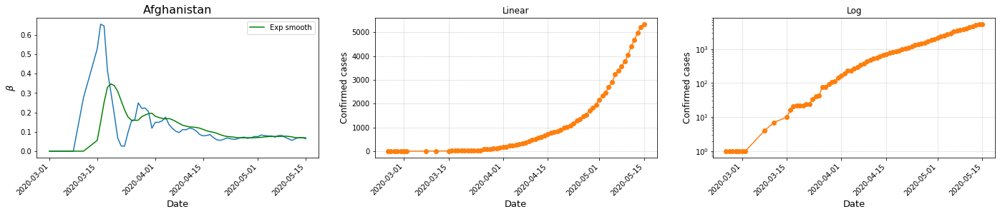

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


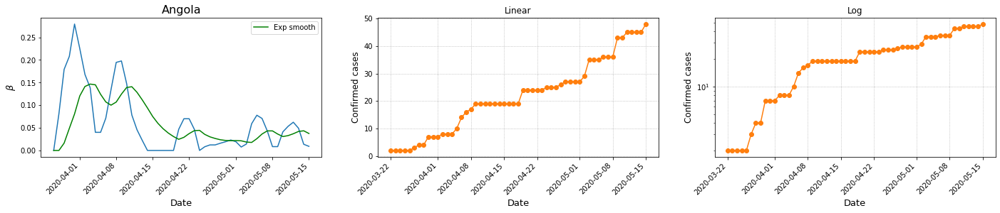

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


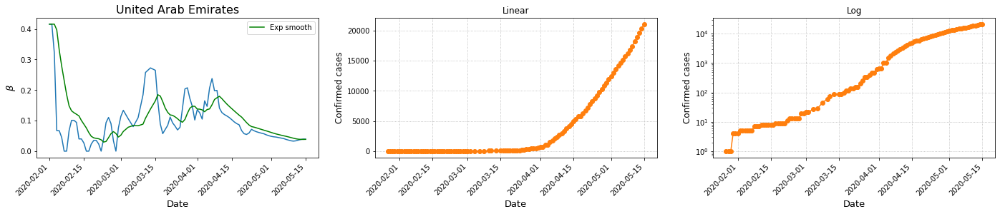

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


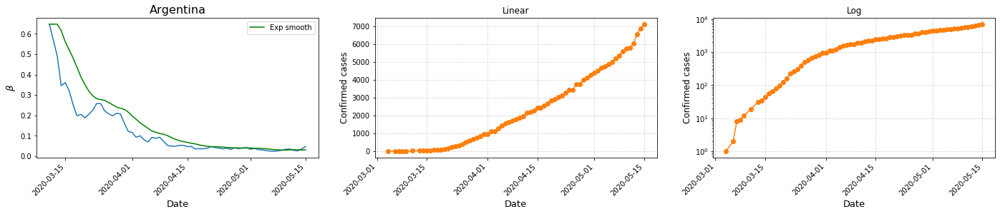

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


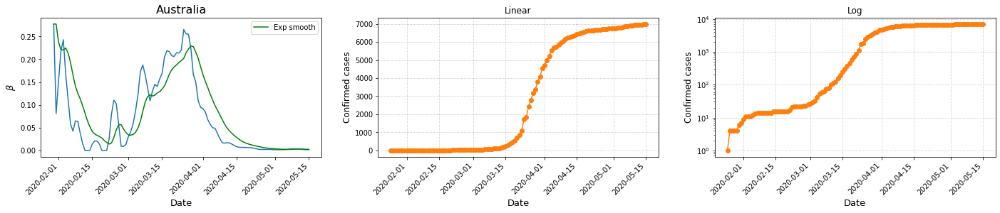

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


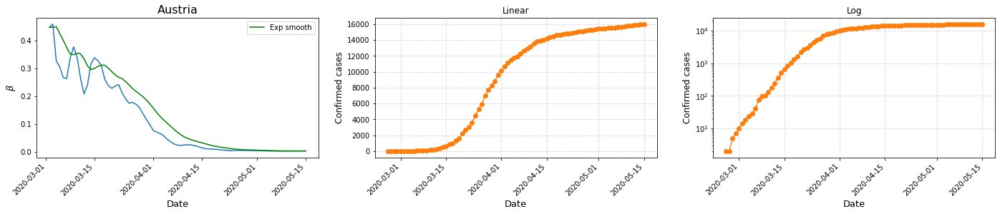

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


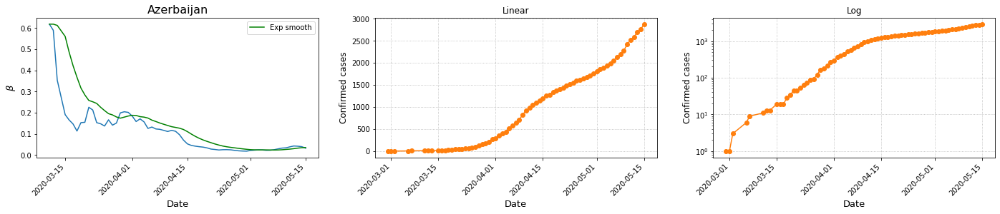

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


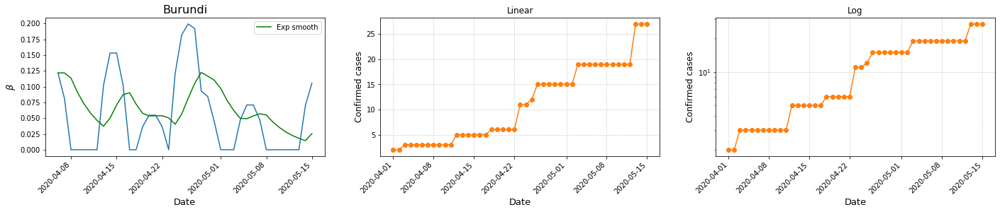

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


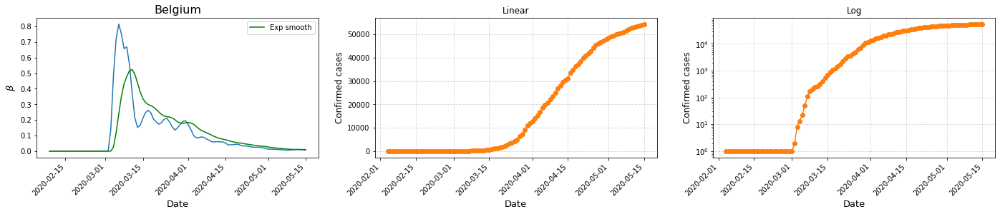

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


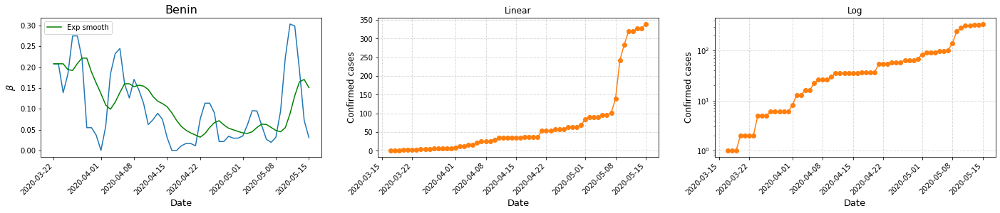

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


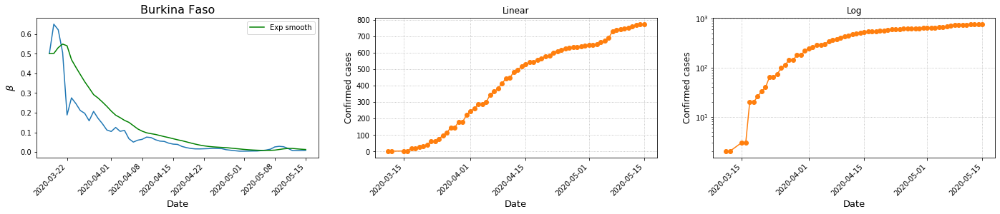

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


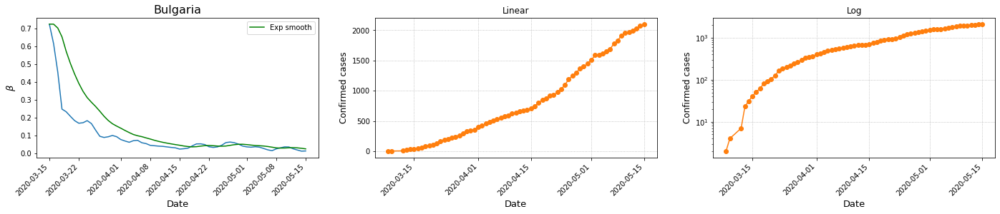

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


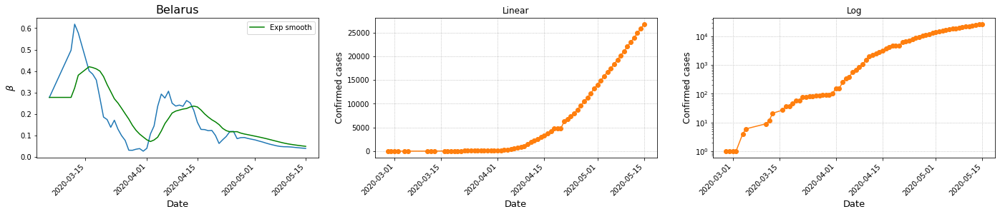

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


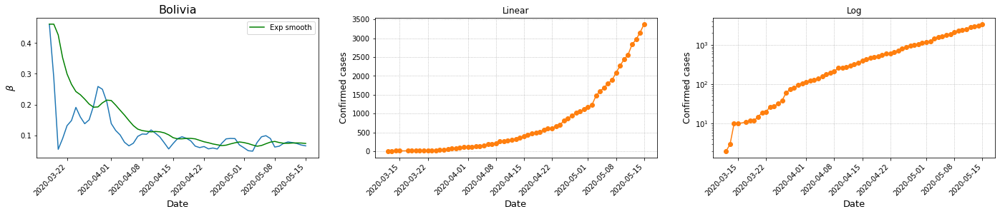

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


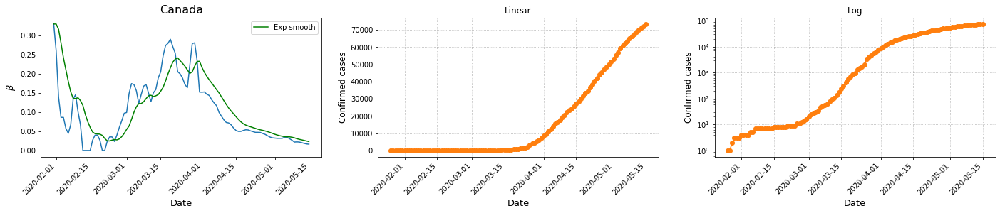

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


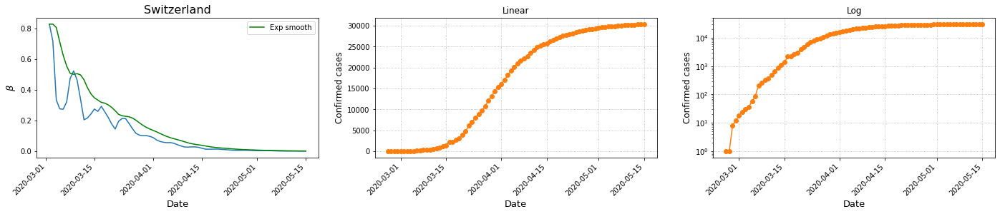

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


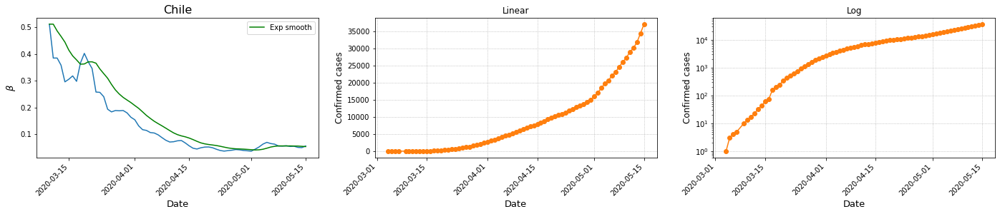

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


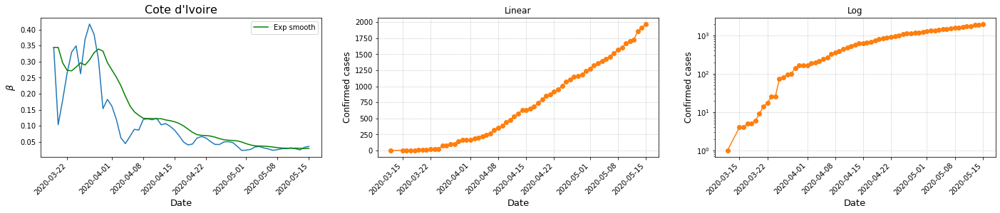

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


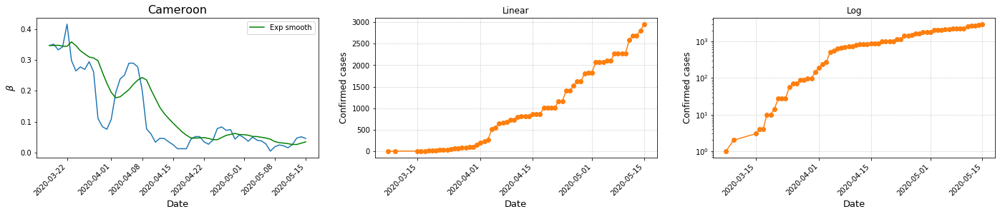

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


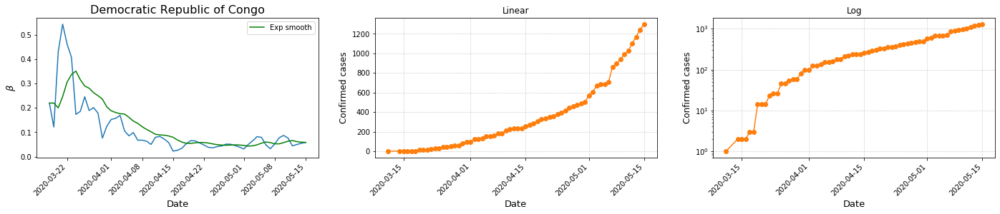

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


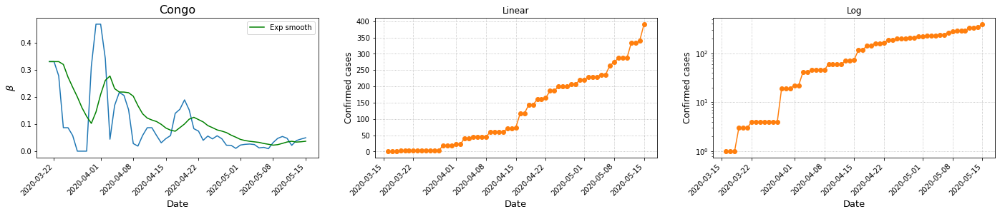

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


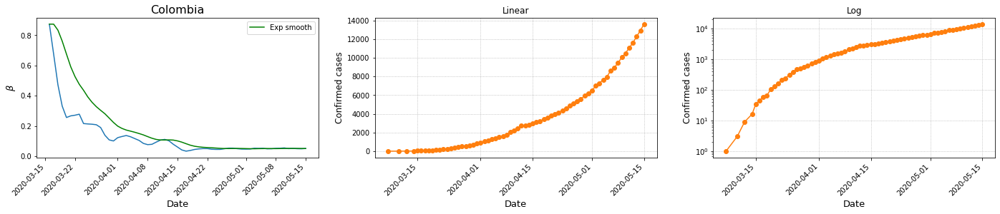

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


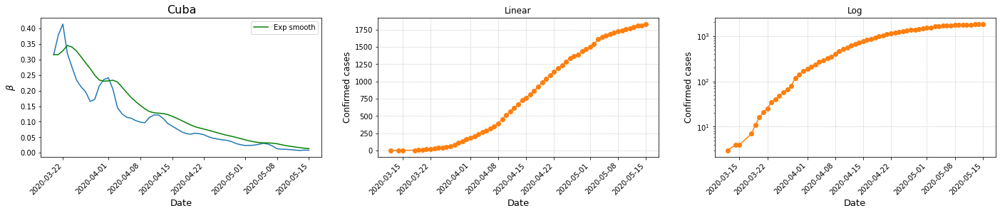

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


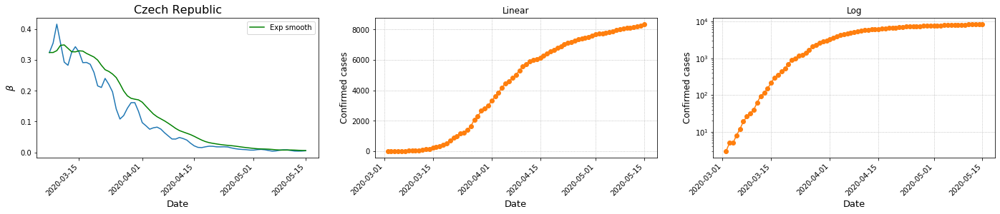

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


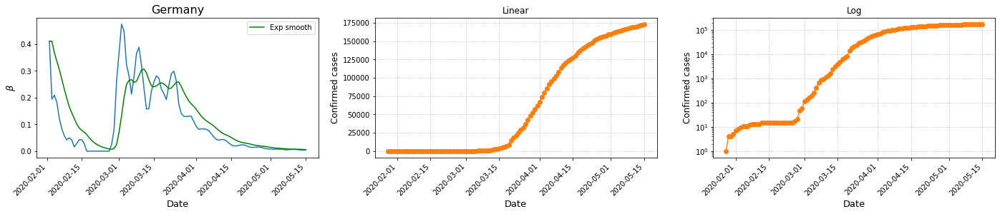

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


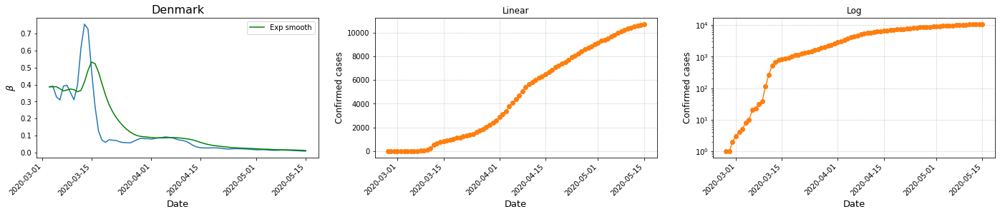

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


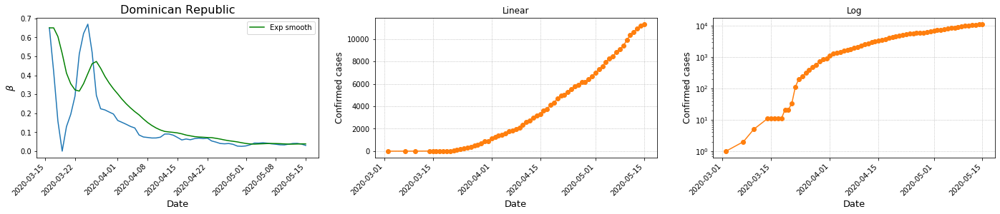

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


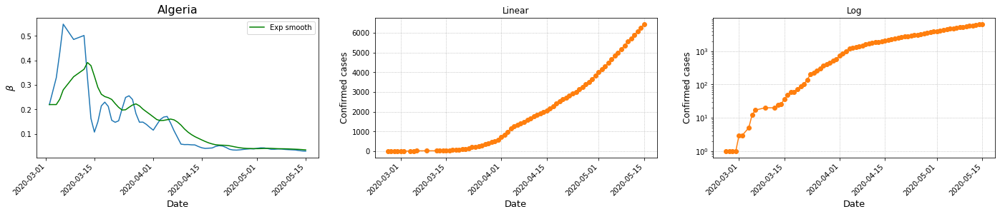

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


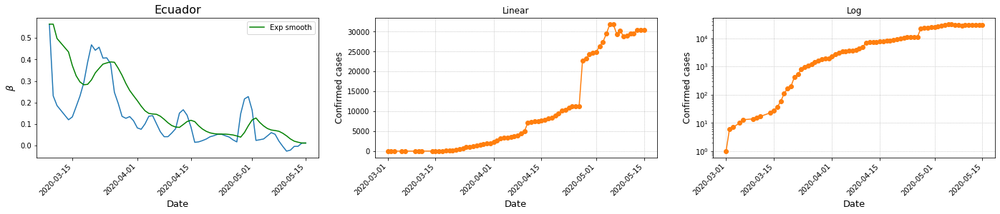

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


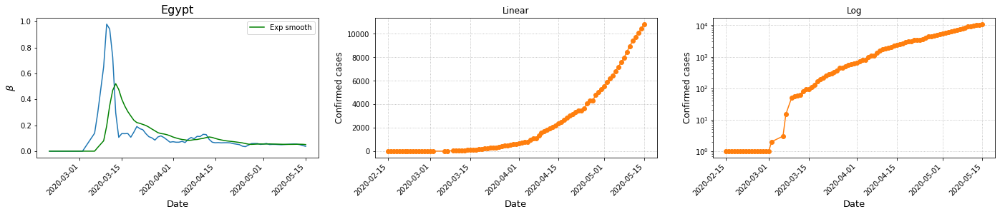

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


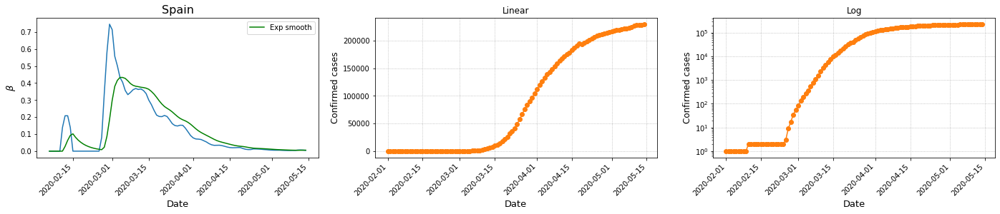

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


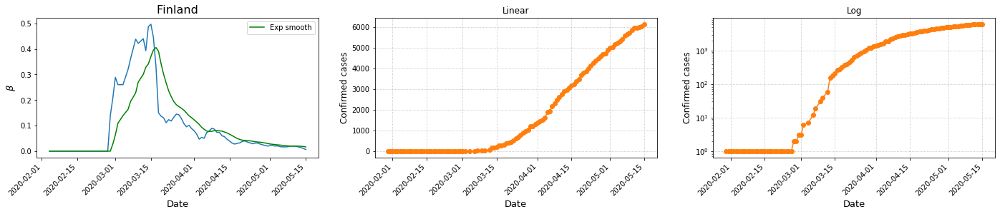

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


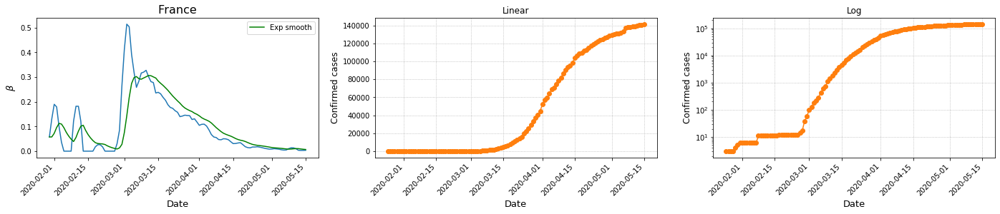

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


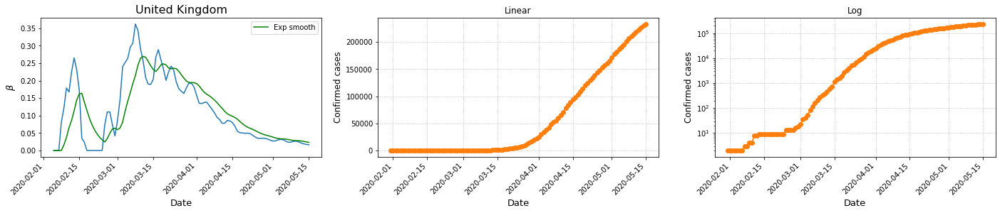

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


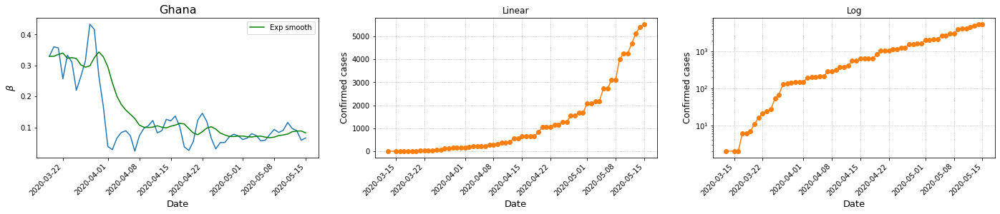

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


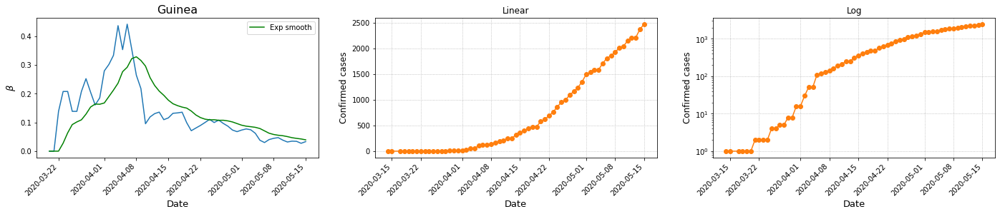

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


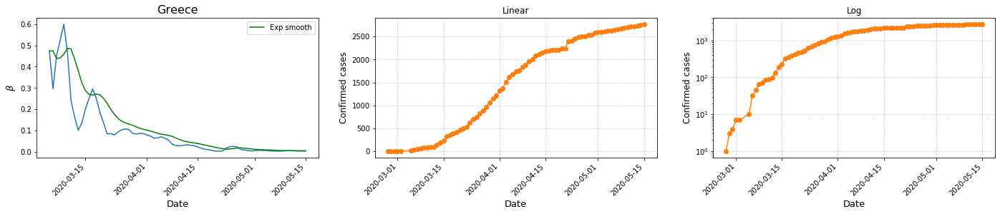

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


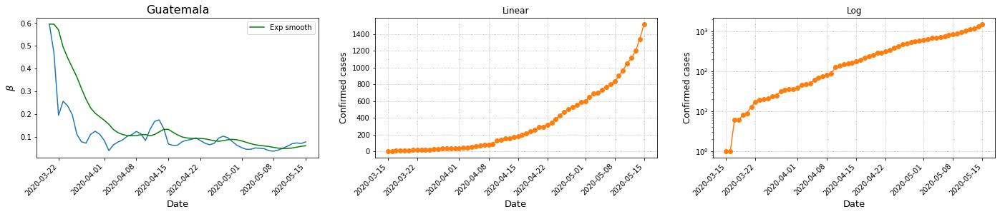

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


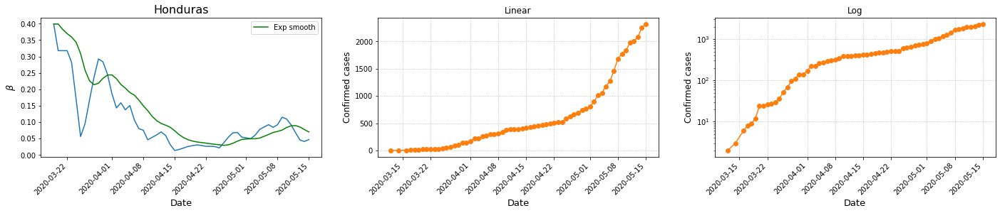

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


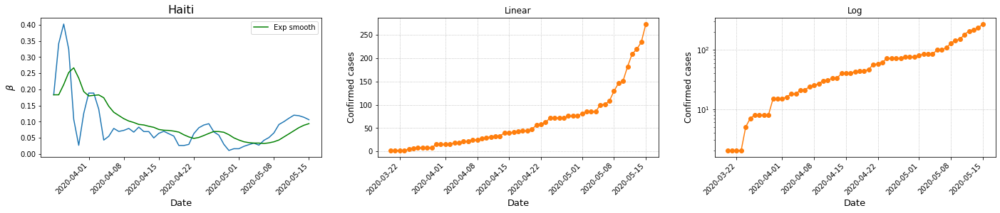

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


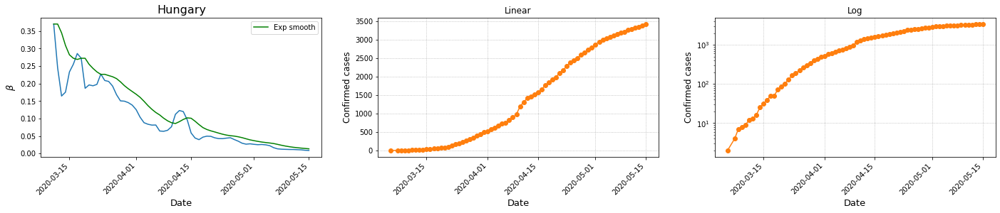

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


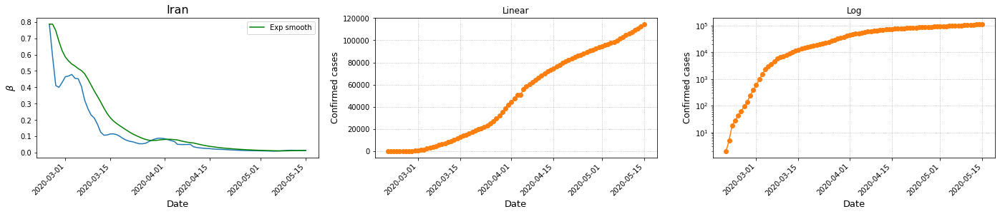

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


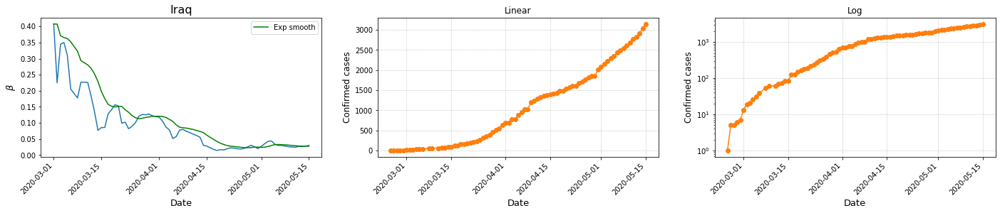

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


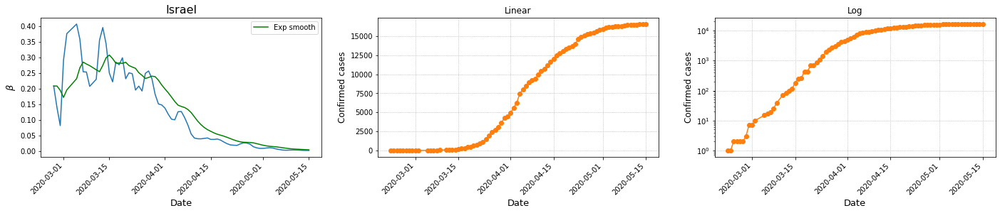

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


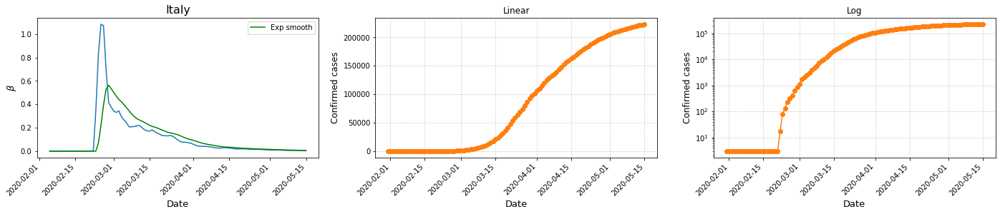

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


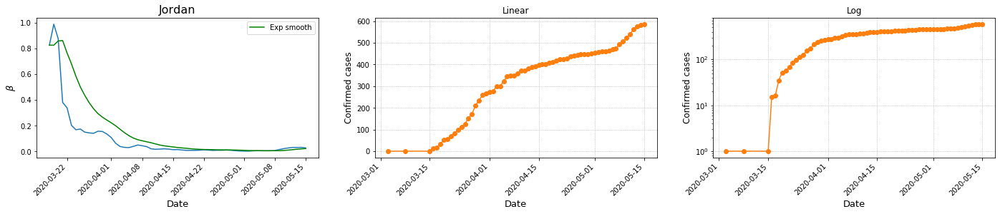

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


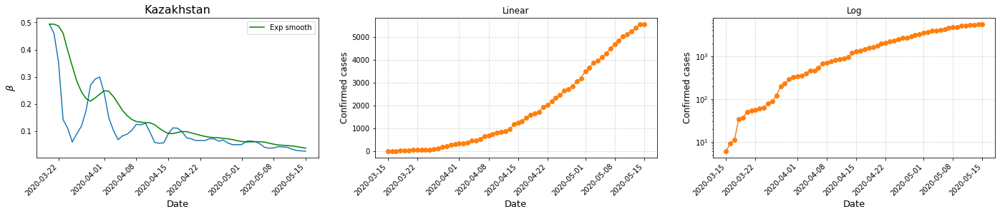

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


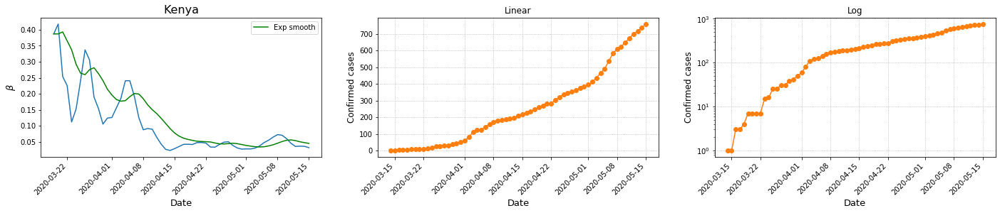

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


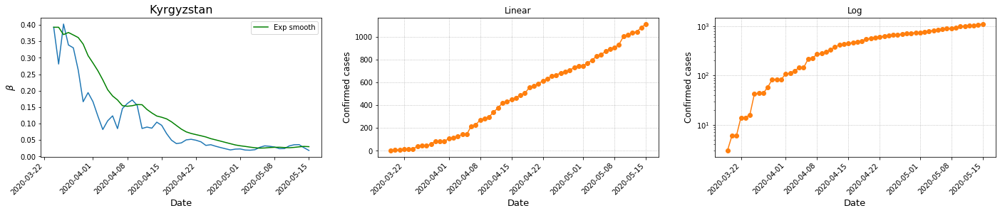

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


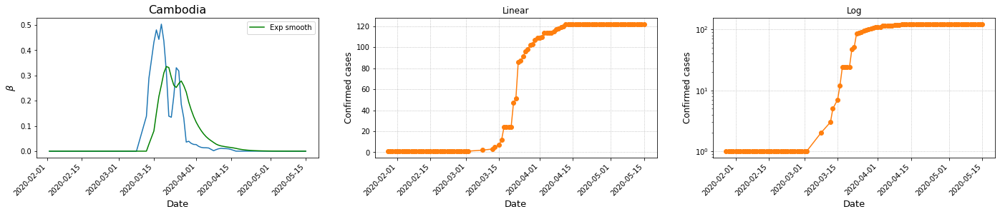

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


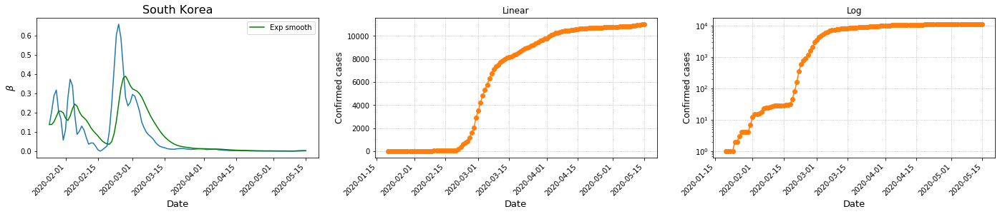

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


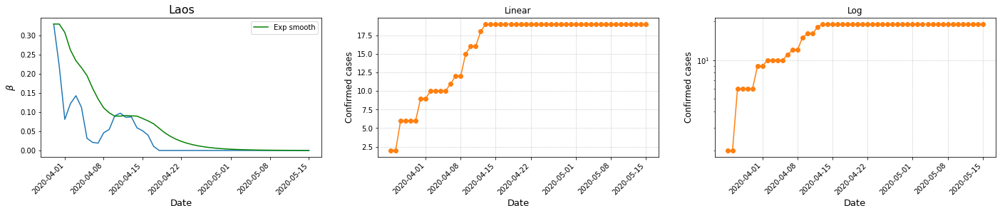

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


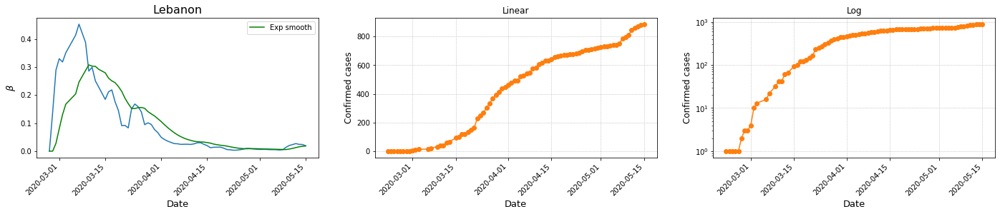

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


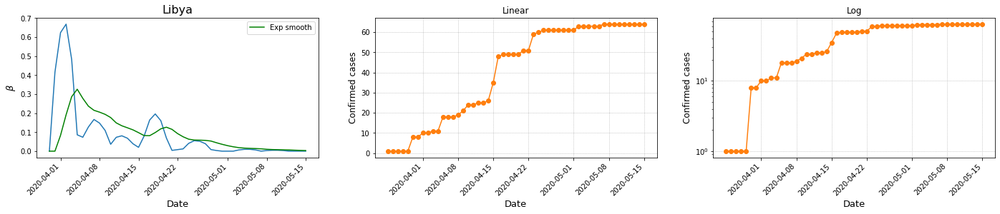

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


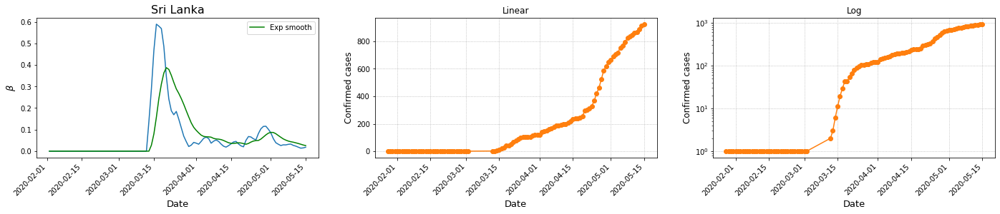

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


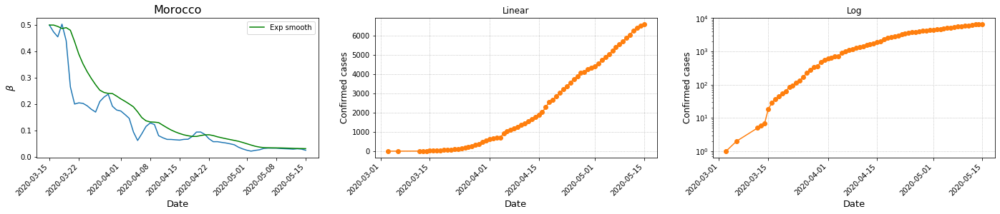

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


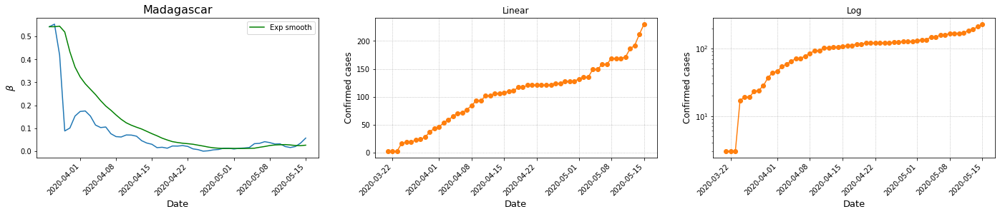

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


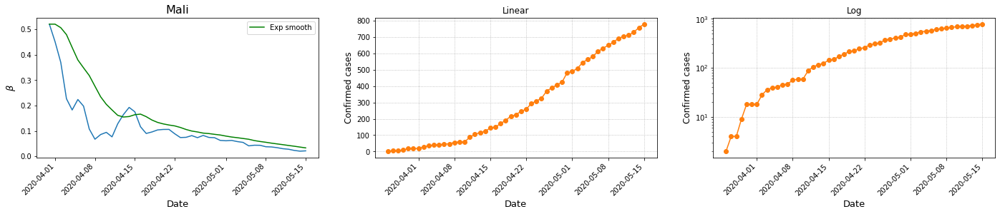

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


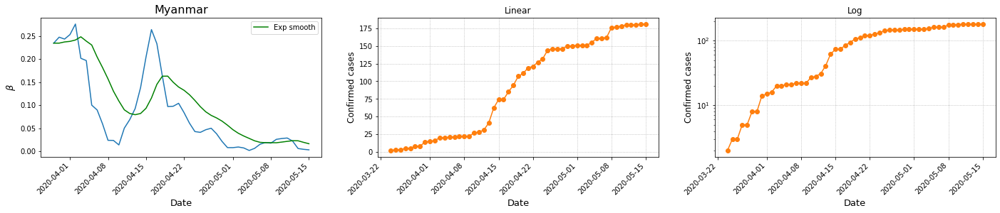

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


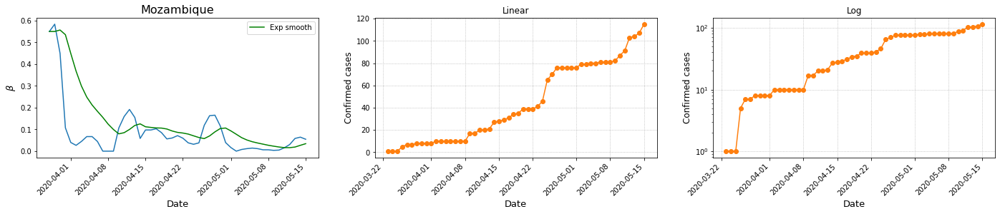

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


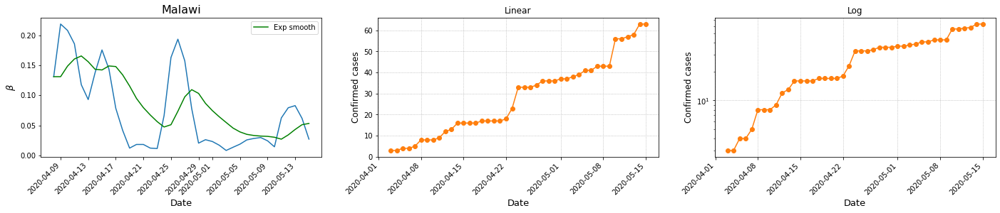

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


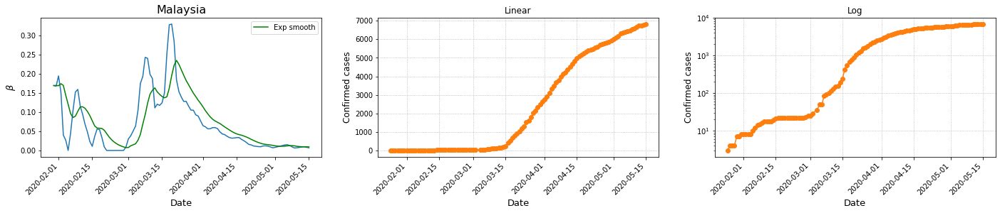

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


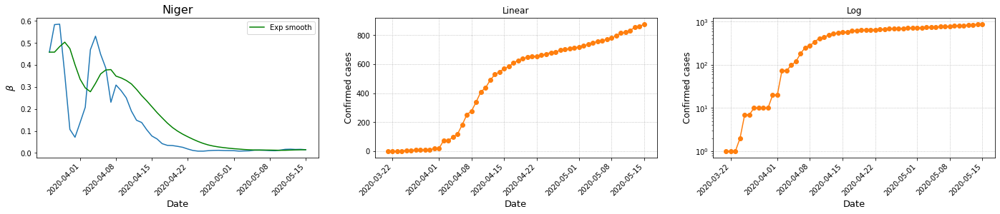

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


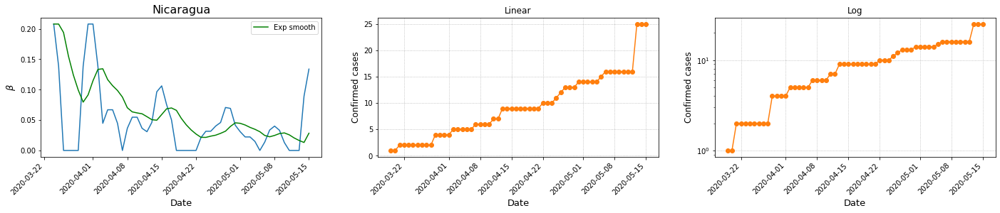

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


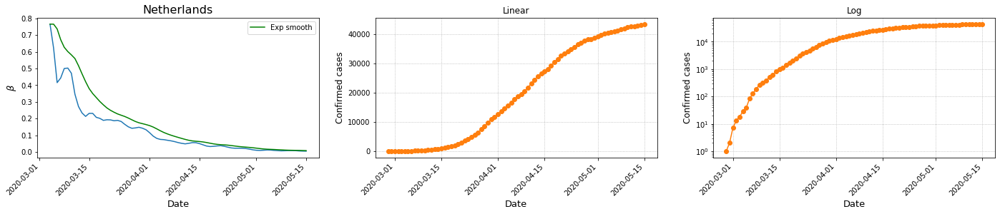

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


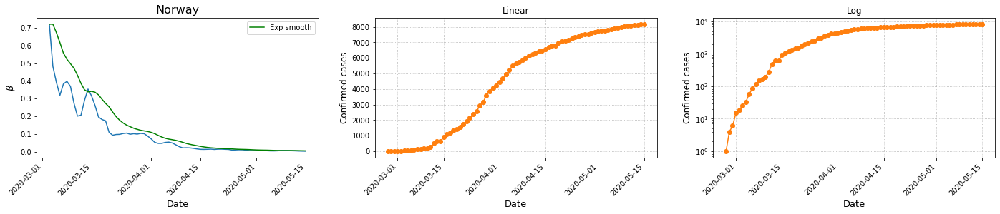

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


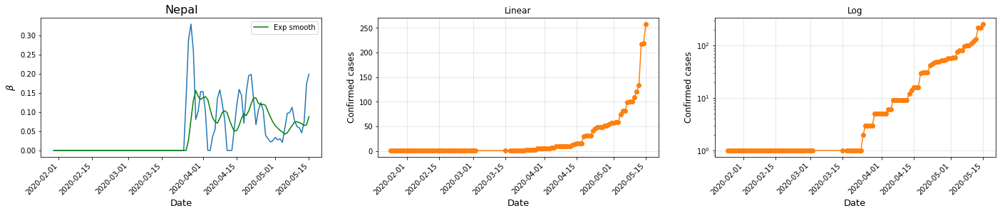

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


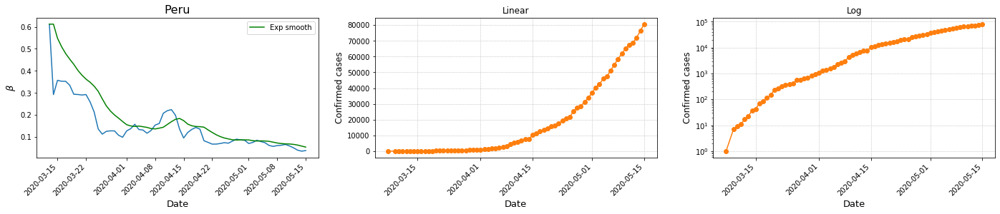

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


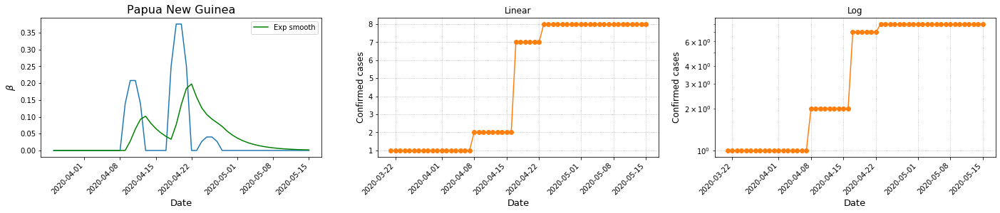

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


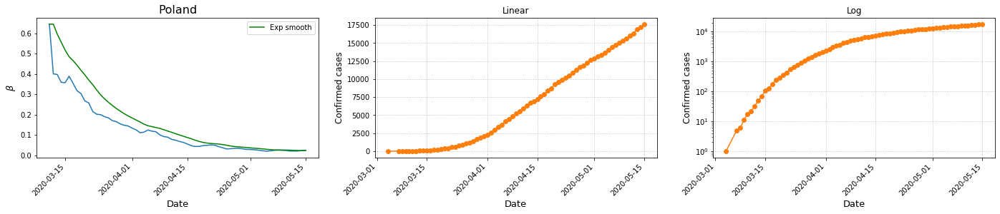

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


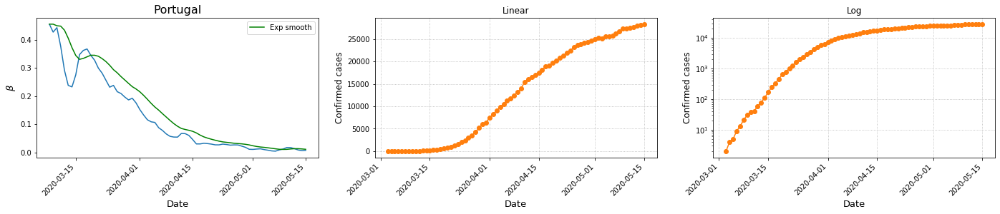

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


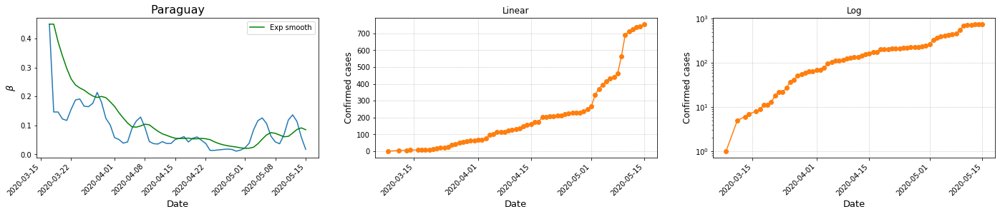

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


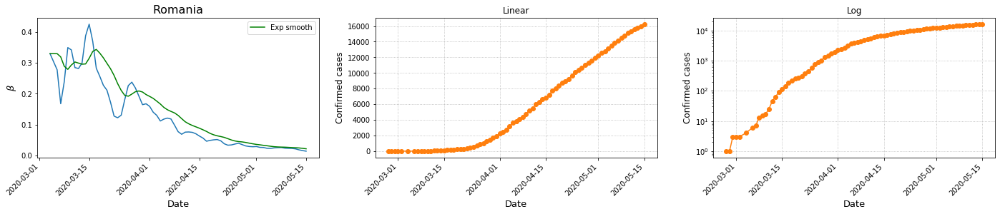

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


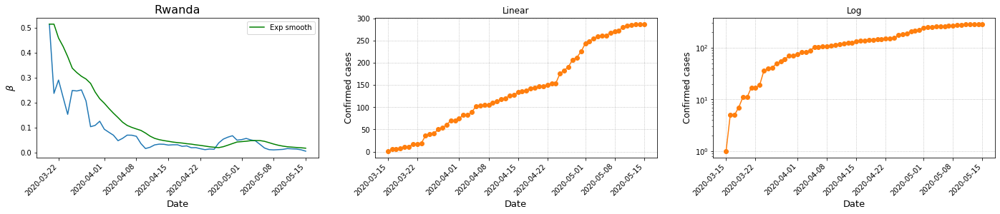

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


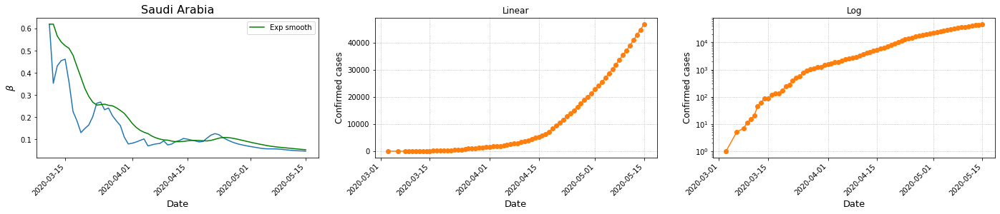

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


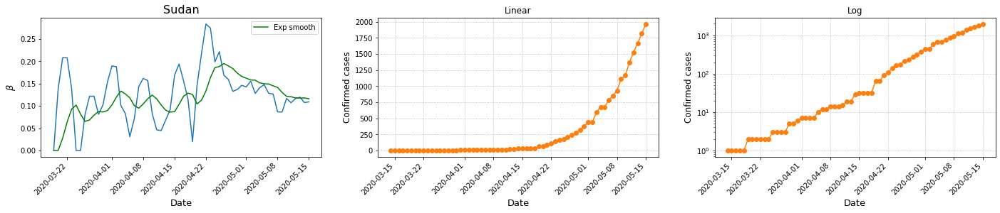

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


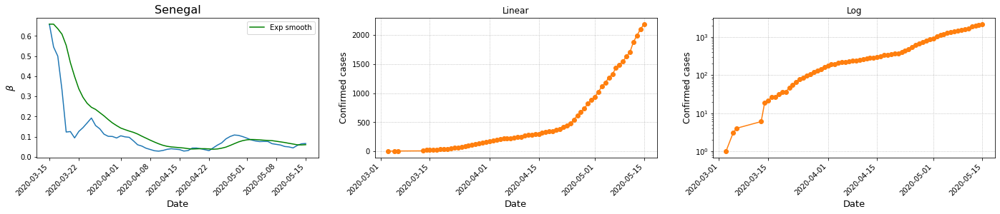

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


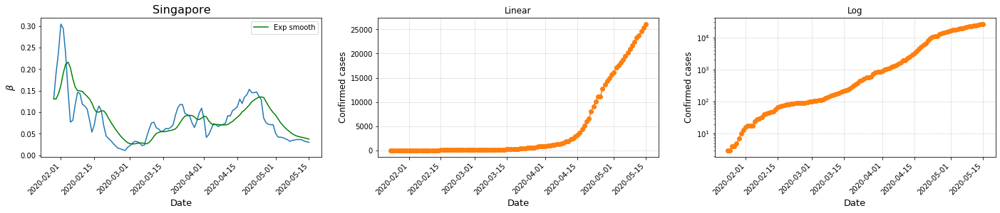

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


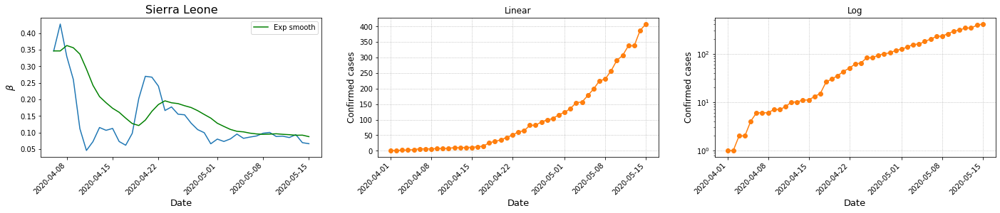

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


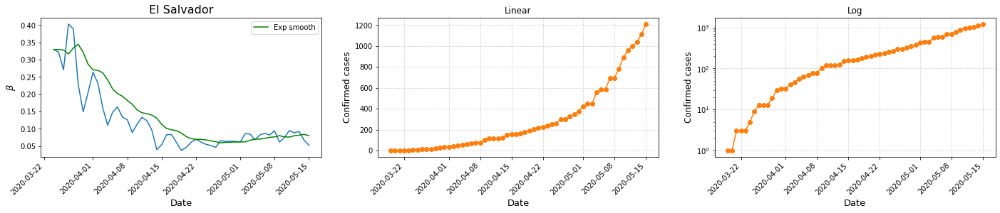

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


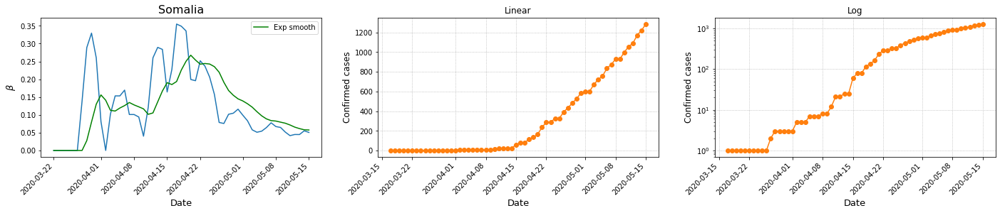

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


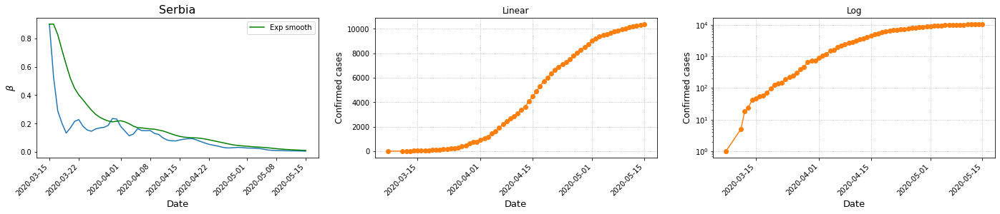

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


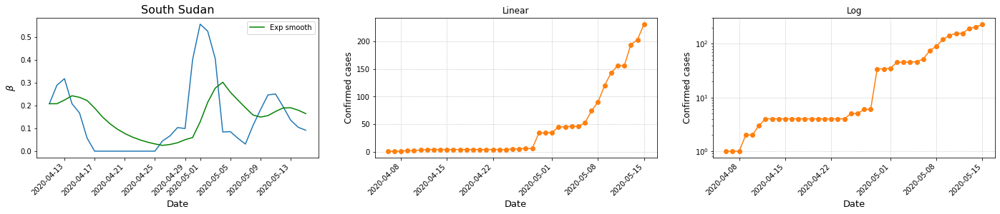

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


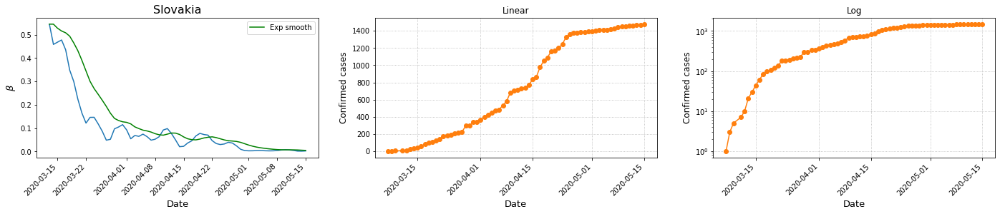

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


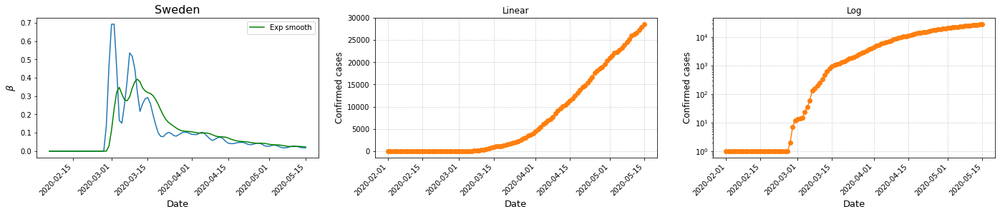

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


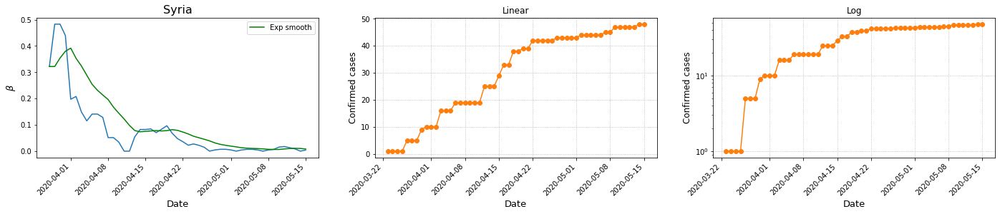

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


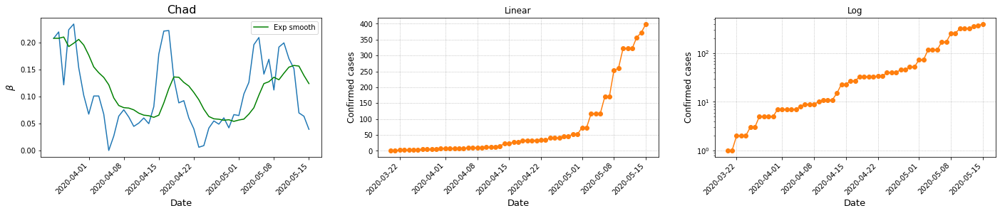

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


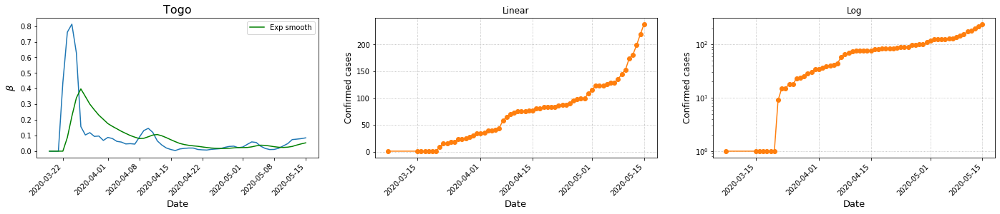

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


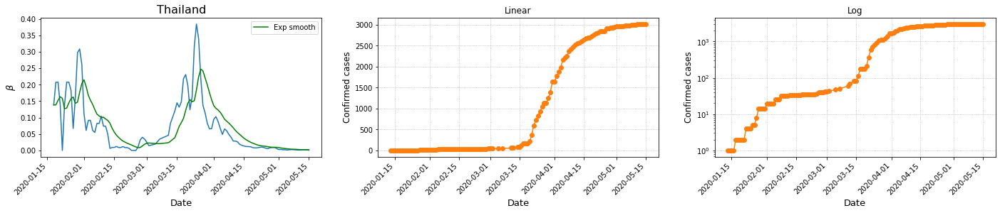

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


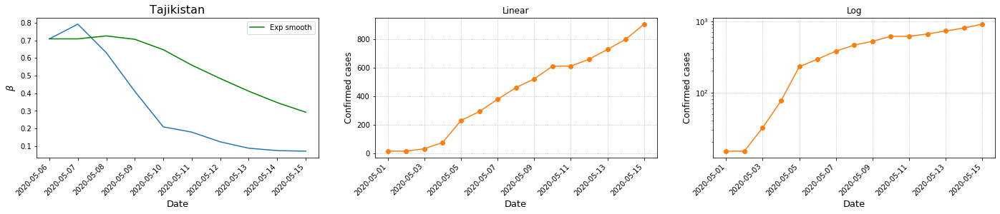

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


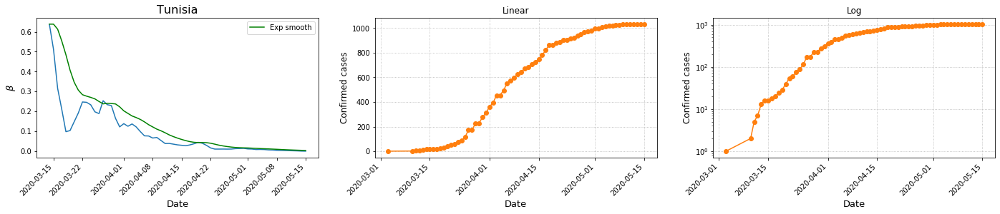

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


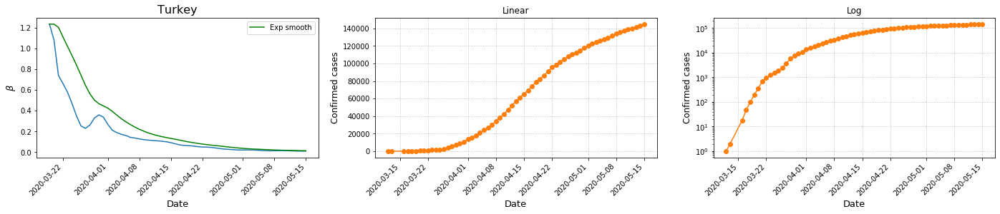

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


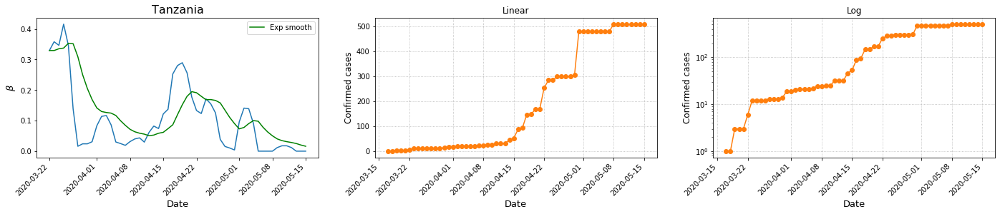

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


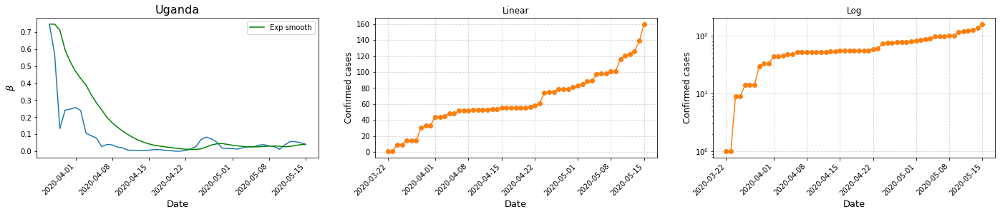

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


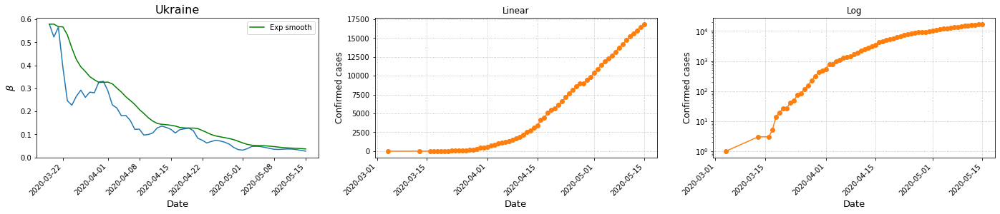

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


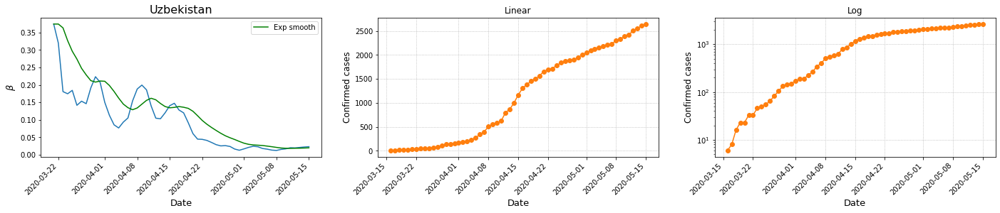

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


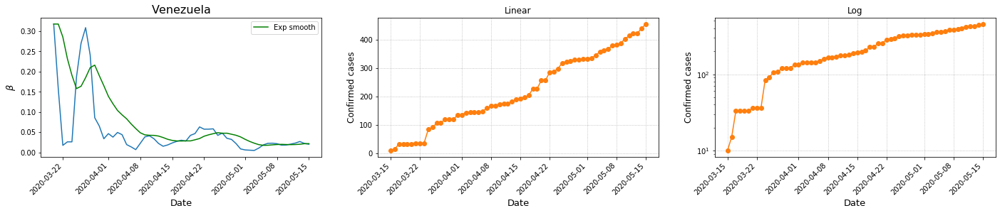

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


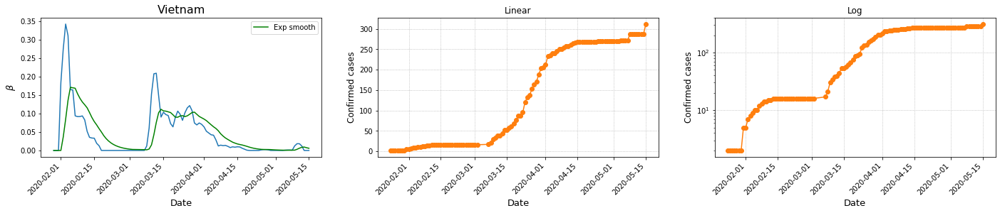

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


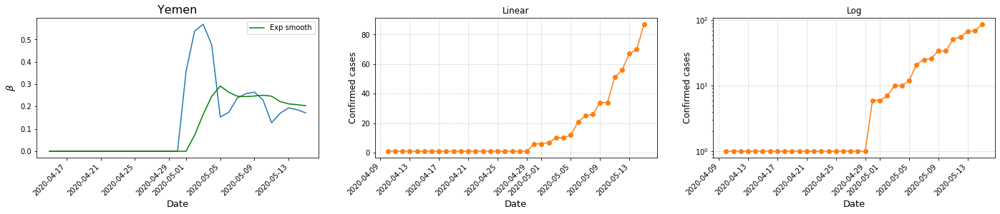

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


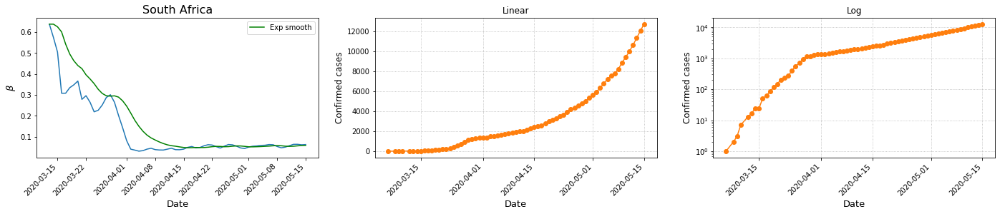

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


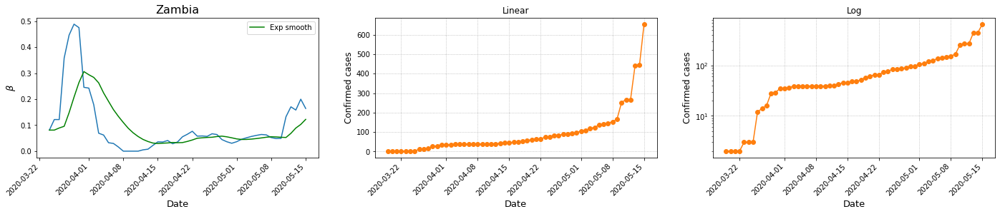

/home/rodrigo/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


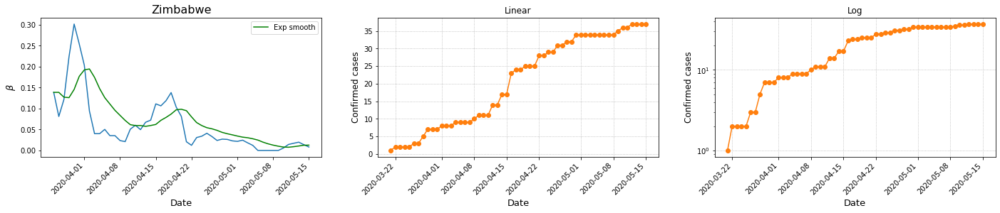

In [54]:
df_WORLD_ = pd.DataFrame(columns = df_WORLD.columns.values)
df_WORLD_['grad'] = ''
df_WORLD_['grad_smooth'] = ''


for country in countries:
    
    df = df_WORLD[ df_WORLD['location'] == country].set_index('date')
    df = df [ df['total_cases']  > 0]

    df.index = pd.to_datetime(df.index)
    
    X = np.arange(len(df['total_cases'])).reshape(-1, 1)
    y = np.array(df[['total_cases']]).reshape(len(df[['total_cases']])).reshape(-1, 1)
    idx = np.array(df.index)
    
    # Gradient calculation
    gradient = rolling_beta(X= X, y= y, idx= idx, window= 5)
    # Exponential smooth
    fit_ExpS = SimpleExpSmoothing(gradient).fit(smoothing_level= 0.2, optimized= False)
    
    # Plot
    fig, axes = plt.subplots(nrows= 1, ncols= 3, figsize=(24, 4))
    
    # We only look to the last third of gradients
    begin = 2*int(len(gradient) / 3)
    end = len(gradient)
        
    axes[0].plot(gradient)
    axes[0].set_title(country, fontsize= 16)
    axes[0].set_ylabel('$\\beta$', fontsize= 13)
    axes[0].set_xlabel('Date', fontsize= 13)
    axes[0].grid(linestyle=':')
    fit_ExpS.fittedvalues.plot(ax= axes[0], color='green', label= 'Exp smooth')
    axes[0].legend()
   
    
    axes[1].plot(df[['total_cases']], 'o-', color= 'C1')
    axes[1].set_ylabel('Confirmed cases', fontsize= 12)
    axes[1].set_xlabel('Date', fontsize= 13)
    axes[1].grid(linestyle=':')
    axes[1].set_title('Linear', fontsize= 12)
    
    axes[2].plot(df[['total_cases']], 'o-', color= 'C1')
    axes[2].set_ylabel('Confirmed cases', fontsize= 12)
    axes[2].set_xlabel('Date', fontsize= 13)
    axes[2].grid(linestyle=':')
    axes[2].set_title('Log', fontsize= 12)
    axes[2].set_yscale('log')
    
    
    fig.autofmt_xdate(rotation= 45)
    plt.show()
    
    # Keeping the values in a Data Frame
    df['grad'] = gradient[begin: end]
    df['grad_smooth'] = fit_ExpS.fittedvalues[begin: end]
    #df = df.reset_index()
    df_WORLD_ = pd.concat([df_WORLD_, df.reset_index()], ignore_index=True)

In [19]:
#df_WORLD_.to_pickle('results/dfs/grad_local_window_14.pkl') 

#df_WORLD_ = pd.read_picke('results/dfs/grad_local_window_14.pkl')

#### Critical value $\beta_c$ for the gradient

We now choose the critical value $\beta_c$ for the gradient. If $d$ is the number of days for which the total confirmed cases doubles, we have:


$$  \frac{e^{\beta(t + d)}}{e^{\beta t} } = 2 \; \; \;   \Rightarrow  \; \; \; \beta = \frac{\log 2}{d}    $$

For $d_c$ days:

$$ \beta_c = \frac{\log 2}{d_c} \; \;  \text{days}^{-1} $$ 

In [55]:
d_c = 14

beta_c = np.log(2) / d_c
beta_c

0.049510512897138946

In [56]:
df_WORLD_th = df_WORLD_[ (df_WORLD_['grad_smooth'] > 0.    ) &
                         (df_WORLD_['grad_smooth'] <= beta_c)]

Countries which have achieved the threshold.

In [57]:
countries_th = df_WORLD_th['location'].unique()
countries_th

array(['Angola', 'United Arab Emirates', 'Argentina', 'Australia',
       'Austria', 'Azerbaijan', 'Burundi', 'Belgium', 'Benin',
       'Burkina Faso', 'Bulgaria', 'Belarus', 'Canada', 'Switzerland',
       'Chile', "Cote d'Ivoire", 'Cameroon',
       'Democratic Republic of Congo', 'Congo', 'Cuba', 'Czech Republic',
       'Germany', 'Denmark', 'Dominican Republic', 'Algeria', 'Ecuador',
       'Spain', 'Finland', 'France', 'United Kingdom', 'Guinea', 'Greece',
       'Guatemala', 'Honduras', 'Haiti', 'Hungary', 'Iran', 'Iraq',
       'Israel', 'Italy', 'Jordan', 'Kazakhstan', 'Kenya', 'Kyrgyzstan',
       'Cambodia', 'South Korea', 'Laos', 'Lebanon', 'Libya', 'Sri Lanka',
       'Morocco', 'Madagascar', 'Mali', 'Myanmar', 'Mozambique', 'Malawi',
       'Malaysia', 'Niger', 'Nicaragua', 'Netherlands', 'Norway', 'Nepal',
       'Papua New Guinea', 'Poland', 'Portugal', 'Paraguay', 'Romania',
       'Rwanda', 'Senegal', 'Singapore', 'Serbia', 'Slovakia', 'Sweden',
       'Syria', 'Togo

Now let's take a look on the `total_cases_per_million` on the last date available for those countries.

In [58]:
total_per_million_ = []


for country in countries_th:
    
    total_per_million = list(df_WORLD_[ df_WORLD_['location'] == country ]['total_cases_per_million'])
    
    total_per_million_.append(total_per_million[-1])
    
df_th = pd.DataFrame({'Country': countries_th, 'Total per million': total_per_million_})

df_th = df_th.set_index('Country')

df_th = df_th.sort_values(by= ['Total per million'])

Take a look at the $n_l$ largest `df_th['Totall per million']` values. Spain will be take as the worst case.

In [59]:
n_l = 15

df_th.nlargest(n_l, 'Total per million' )

,Total per million
Country,
Spain,4909.444
Belgium,4684.193
Singapore,4460.935
Italy,3689.865
Switzerland,3510.265
United Kingdom,3434.449
Belarus,2833.219
Sweden,2830.106
Portugal,2777.269


Take a look at the $n_s$ smallest `df_th['Totall per million']` values. We will neglected countries from America and Africa, because epidemics started later. Therefore, our best case will be South Korea.

In [60]:
n_s = 15

df_th.nsmallest(n_s, 'Total per million')

,Total per million
Country,
Papua New Guinea,0.894
Angola,1.460
Burundi,2.271
Zimbabwe,2.489
Laos,2.611
Syria,2.743
Vietnam,3.205
Malawi,3.293
Myanmar,3.327
